# Packages

In [1]:
import torch
import argparse
import torch
import torchvision
from torch import nn, optim
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils import data
from PIL import Image
import numpy as np
import os
import time
from google.colab import drive
import pandas as pd
from copy import deepcopy
# imports the torch_xla package
#import torch_xla
#import torch_xla.core.xla_model as xm
# import matplotlib
# import matplotlib.pyplot as plt
# import json
torch.cuda.empty_cache()

# Connect to Google Drive

In [2]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


# Global Variables

In [3]:
ZIP_PATH = "/content/gdrive/Othercomputers/My Laptop/Google Drive/College/GasHisSDB/160.zip"
IMAGE_FOLDER = "/content/160_unzip"
CHECKPOINT_FOLDER = "/content/gdrive/Othercomputers/My Laptop/Google Drive/College/GasHisSDB/Checkpoint Files"

# Unzip Images to Colab Memory

In [4]:
!unzip -u "$ZIP_PATH" -d "$IMAGE_FOLDER"

Streaming output truncated to the last 5000 lines.
  inflating: /content/160_unzip/160/Normal/Normal-15161.png  
  inflating: /content/160_unzip/160/Normal/Normal-15162.png  
  inflating: /content/160_unzip/160/Normal/Normal-15163.png  
  inflating: /content/160_unzip/160/Normal/Normal-15164.png  
  inflating: /content/160_unzip/160/Normal/Normal-15165.png  
  inflating: /content/160_unzip/160/Normal/Normal-15166.png  
  inflating: /content/160_unzip/160/Normal/Normal-15167.png  
  inflating: /content/160_unzip/160/Normal/Normal-15168.png  
  inflating: /content/160_unzip/160/Normal/Normal-15169.png  
  inflating: /content/160_unzip/160/Normal/Normal-15170.png  
  inflating: /content/160_unzip/160/Normal/Normal-15171.png  
  inflating: /content/160_unzip/160/Normal/Normal-15172.png  
  inflating: /content/160_unzip/160/Normal/Normal-15173.png  
  inflating: /content/160_unzip/160/Normal/Normal-15174.png  
  inflating: /content/160_unzip/160/Normal/Normal-15175.png  
  inflating: /conte

# Data processing Functions

In [5]:
def data_transformation(args):

    # Create the parser and add arguments
    tf = transforms.Compose([transforms.ToTensor(),
                             transforms.Normalize((0.9039, 0.7863, 0.9073), (0.1124, 0.1548, 0.0892)) # values taken from CalcZScores.py function
                             ])

    dataset = ImageFolder(root=args["image_dir"], transform=tf)
    total_count = len(dataset)
    train_count = int(0.4 * total_count)
    valid_count = int(0.3 * total_count)
    test_count = total_count - train_count - valid_count
    train_dataset, valid_dataset, test_dataset = torch.utils.data.random_split(dataset, (train_count, valid_count, test_count))

    train_data_loader = data.DataLoader(train_dataset, batch_size=args["batch_size"], shuffle=True, num_workers = args["dataloader_workers"])
    valid_data_loader = data.DataLoader(valid_dataset, batch_size=args["batch_size"], shuffle=True, num_workers = args["dataloader_workers"])
    test_data_loader = data.DataLoader(test_dataset, batch_size=args["batch_size"], shuffle=True, num_workers = args["dataloader_workers"])
    
    return train_data_loader, valid_data_loader, test_data_loader, dataset.class_to_idx


def load_ckp(checkpoint_fpath, model, optimizer):
    """
    checkpoint_path: path to save checkpoint
    model: model that we want to load checkpoint parameters into       
    optimizer: optimizer we defined in previous training
    """
    # load check point
    checkpoint = torch.load(checkpoint_fpath)
    # initialize state_dict from checkpoint to model
    model.load_state_dict(checkpoint['state_dict'])
    # initialize optimizer from checkpoint to optimizer

    # trained_epochs = checkpoint['trained_epochs']

    optimizer.load_state_dict(checkpoint['optim_stat_dict'])
    # initialize valid_loss_min from checkpoint to valid_loss_min
    statistics_df = checkpoint['statistics_df']
    # return model, optimizer, epoch value, min validation loss 
    return model, optimizer, statistics_df

def process_image(image_path):

    tf = transforms.Compose([transforms.ToTensor(),
                             transforms.Normalize((0.9039, 0.7863, 0.9073), (0.1124, 0.1548, 0.0892)) # values taken from CalcZScores.py function
                             ])
    image = Image.open(image_path)
    image.show()

    tensor = tf(image)

    # return tensor
    return tensor

def predict(image_path, model):

    image = process_image(image_path)
    image = image.unsqueeze(0)

    # move to device
    image = image.to("cuda")

    model.eval()
    with torch.no_grad():
        y_prob = model(image).item()
        y_pred = int(round(y_prob))

    class_to_idx = {'Abnormal': 0, 'Normal': 1}
    idx_to_class = {v:k for k, v in class_to_idx.items()}
    class_label = idx_to_class[y_pred]
    class_prob = y_prob if class_label == "Normal" else 1-y_prob

    print("Prediction: {} Probability: {}%".format(class_label, round(class_prob,2)*100))
    return class_label, y_prob, class_prob

def print_predictions(args):
    # load model
    model, optimizer = get_pretrained_model(args)
    model, optimizer, statistics_df = load_ckp(args["model_filepath"], model, optimizer)

    model.to("cuda")
    # predict image
    class_label, y_prob, class_prob = predict(args["image_filepath"], model)
    return class_label, y_prob, class_prob



In [6]:
def get_pretrained_model(args):
    # Use pre-trained model
    # region build model using pretained vgg model
    if args["model_arch"] == "vgg11":
        model = torchvision.models.vgg11(pretrained=True)
    elif args["model_arch"] == "vgg13":
        model = torchvision.models.vgg13(pretrained=True)
    elif args["model_arch"] == "vgg16":
        model = torchvision.models.vgg16(pretrained=True)
    elif args["model_arch"] == "vgg19":
        model = torchvision.models.vgg19(pretrained=True)
    elif args["model_arch"] == "resnet50":
        model = torchvision.models.resnet50(pretrained=True)
    elif args["model_arch"] == "resnet18":
        model = torchvision.models.resnet18(pretrained=True)

    # freeze model parameters
    for param in model.parameters():
        param.requires_grad = False

    if args["model_arch"][:3] == "vgg":
        in_features_of_pretrained_model = model.classifier[0].in_features
        # replace final 1000 class classifier with a just 1
        classifier = nn.Sequential(nn.Linear(in_features=in_features_of_pretrained_model, out_features=2048, bias=True),
                                  nn.ReLU(inplace=True),
                                  nn.Dropout(p=0.2),
                                  nn.Linear(in_features=2048, out_features=1, bias=True),
                                  nn.Sigmoid()
                                  )

        model.classifier = classifier

        # specify optimizer, using only classifer params. don't want to change the rest of VGG19
        optimizer = optim.Adam(model.classifier.parameters(), lr=args["learning_rate"])

    elif args["model_arch"][:6] == "resnet":

        classifier = nn.Sequential(nn.Linear(in_features=model.fc.in_features, out_features=2048, bias=True),
                            nn.ReLU(inplace=True),
                            nn.Dropout(p=0.2),
                            nn.Linear(in_features=2048, out_features=1, bias=True),
                            nn.Sigmoid()
                            )
        model.fc = classifier

        # specify optimizer, using only classifer params. don't want to change the rest of VGG19
        optimizer = optim.Adam(model.fc.parameters(), lr=args["learning_rate"])

    return model, optimizer

# Training Function

In [7]:
# def train_model(args, train_data_loader, valid_data_loader, class_to_idx, statistics_df):

def train(args, model, optimizer, train_data_loader, valid_data_loader, class_to_idx, statistics_df):

    # train
    # specify criterion
    criterion = nn.BCELoss()

    # specify optimizer, using only classifer params. don't want to change the rest of VGG19
    # optimizer = optim.Adam(model.classifier.parameters(), lr=args["learning_rate"])

    # decide device depending on user arguments and device availability
    if args["gpu"] and torch.cuda.is_available():
        device = 'cuda'
    elif args["gpu"] and not (torch.cuda.is_available()):
        device = 'cpu'
        print("GPU was selected as the training device, but no GPU is available. Using CPU instead.")
    elif args["tpu"]: 
        device = xm.xla_device()        
    else:
        device = 'cpu'
    print("Using {} to train model.".format(device))

    # move model to selected device
    model.to(device)

    # init variables for tracking loss/steps etc.
    print_every = 1


    # for each epoch
    for e in range(args["epochs"]):
        print("Epoch: {}/{}".format(e + 1, args["epochs"]))
        step = 0
        running_train_loss = 0
        running_valid_loss = 0
        last_complete_percent = 0
        epoch_start_time = time.time()

        # for each batch of images
        for images, labels in train_data_loader:
            step += 1

            # turn model to train mode
            model.train()

            # move images and model to device
            images, labels = images.to(device), labels.to(device)

            # zeroise grad
            optimizer.zero_grad()

            # forward
            outputs = model(images)

            # loss
            train_loss = criterion(outputs, labels.float().unsqueeze(1))

            # backward
            train_loss.backward()

            # step
            optimizer.step()

            running_train_loss += train_loss.item()

            percent_complete = step / len(train_data_loader)
            if (percent_complete > (last_complete_percent + args["print_every_x_percent"])) and args["verbose"]:
                last_complete_percent = deepcopy(percent_complete)
                print("Epoch: {}/{} Batch % Complete: {:.2f}%".format(e + 1, args["epochs"], percent_complete*100))

        train_end_time = time.time()  

        print("Train Time: {}", train_end_time-epoch_start_time)
        # validate
        # turn model to eval mode
        # turn on no_grad

        last_complete_percent = 0
        model.eval()
        with torch.no_grad():
            print("Validating Epoch....")
            # for each batch of images
            running_accuracy = 0
            running_valid_loss = 0
            step = 0
            for images, labels in valid_data_loader:
                
                step += 1
                
                # move images and model to device
                images, labels = images.to(device), labels.to(device)

                # forward
                outputs = model(images)

                # loss
                valid_loss = criterion(outputs, labels.float().unsqueeze(1))
                running_valid_loss += valid_loss.item()

                # accuracy
                y_hat = torch.round(outputs)

                correct_results_sum = (y_hat == labels.unsqueeze(1)).sum().float()
                acc = correct_results_sum / labels.size(0)

                running_accuracy += acc

                percent_complete = step / len(valid_data_loader)
                if (percent_complete > (last_complete_percent + args["print_every_x_percent"])) and args["verbose"]:
                    last_complete_percent = deepcopy(percent_complete)
                    print("Validation Epoch: {}/{} Batch % Complete: {:.2f}%".format(e + 1, args["epochs"], percent_complete*100))

                # print stats

            average_train_loss = running_train_loss / len(train_data_loader)
            average_valid_loss = running_valid_loss / len(valid_data_loader)
            accuracy = running_accuracy / len(valid_data_loader)
            print("Train Loss: {:.3f}".format(average_train_loss))
            print("Valid Loss: {:.3f}".format(average_valid_loss))
            print("Accuracy: {:.3f}%".format(accuracy * 100))
      
        # need to move stats to cpu as df can only live there, not on gpu
        valid_end_time = time.time()
        print("Validation Time: {}", valid_end_time-train_end_time) 

        stats_row = [e+1, average_train_loss, average_valid_loss, accuracy.item(), train_end_time-epoch_start_time, valid_end_time-train_end_time, valid_end_time-epoch_start_time]
        statistics_df.loc[len(statistics_df.index)] = stats_row

    # region save model

    model.class_to_idx = class_to_idx
    checkpoint = {'state_dict': model.state_dict(),
                  'epochs': args["epochs"],
                  'optim_stat_dict': optimizer.state_dict(),
                  'class_to_idx': model.class_to_idx,
                  'vgg_type': args["model_arch"],
                  "statistics_df": statistics_df
                  }

    torch.save(checkpoint, os.path.join(args["model_output_dir"],  "{}.pth".format(args["model_output_name"])))
    print("model saved to {}".format(os.path.join(args["model_output_dir"], "{}.pth".format(args["model_output_name"]))))

    return statistics_df




# Training Loop

In [8]:
args = {"image_dir": os.path.join(IMAGE_FOLDER, "160"),
        "gpu": True,
        "tpu": False,
        "learning_rate": 0.00002,
        "epochs": 100,
        "model_arch": "vgg16",
        "model_output_name": "100_Epoch_VGG16",
        "model_output_dir": CHECKPOINT_FOLDER,
        "image_filepath": r"/content/160_unzip/160/Abnormal/Abnormal-10120.png",
        "verbose": True,
        "batch_size": 512,
        "print_every_x_percent": .10,
        "dataloader_workers": 2, # 0 should be the default
        "continue_from_checkpoint": False
        }
args["model_filepath"] = "{}.pth".format(os.path.join(args["model_output_dir"], args["model_output_name"]))


In [9]:
model, optimizer = get_pretrained_model(args)

if args["continue_from_checkpoint"]:
    model, optimizer, trained_epochs, statistics_df = load_ckp(args["model_filepath"], model, optimizer)
    args["trained_epochs"] = trained_epochs
else:
  statistics_df = pd.DataFrame(columns=["epoch", "train_loss", "valid_loss", "accuracy", "training_time", "validation_time", "total_time"])

# get data loaders
train_data_loader, valid_data_loader, test_data_loader, class_to_idx = data_transformation(args)

# training_results_df = train(args, model, optimizer, train_data_loader, valid_data_loader, class_to_idx, statistics_df)
# training_results_df




Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

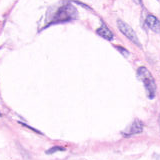

In [10]:
%matplotlib inline
image = Image.open(args["image_filepath"])
image

In [11]:
# checkpoint_list = args_df.name.to_list()

checkpoint_list = ["100_Epoch_ResNet50", "100_Epoch_VGG16"]

statistics_all_df = None

checkpoint_dir = CHECKPOINT_FOLDER

for ckp_name in checkpoint_list:
  chp_fpath = os.path.join(checkpoint_dir, ckp_name + ".pth")

  statistics_df = torch.load(chp_fpath)['statistics_df']
  statistics_df["model_name"] = ckp_name
  statistics_df["best_epoch"] = (statistics_df["valid_loss"] == statistics_df["valid_loss"].min())

  if statistics_all_df is None:
    statistics_all_df = statistics_df.copy()
  else:
    statistics_all_df = statistics_all_df.append(statistics_df)

  # statistics_df[["epoch", 'accuracy', "train_loss", "valid_loss"]].plot.line(x="epoch", secondary_y=['accuracy'])

  adding: content/Images/ (stored 0%)
  adding: content/Images/100_Epoch_ResNet50.png (deflated 2%)
  adding: content/Images/100_Epoch_VGG16.png (deflated 3%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

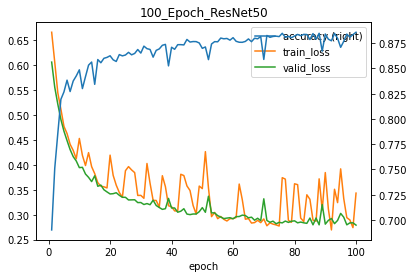

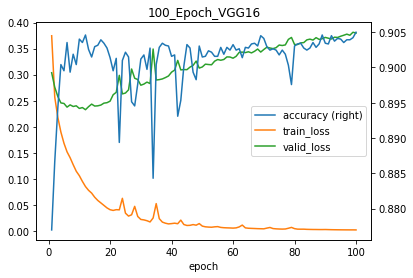

In [12]:
import matplotlib.pyplot as plt

!mkdir Images

for model_name in statistics_all_df.model_name.unique():

    model_df = statistics_all_df[statistics_all_df.model_name == model_name][["epoch", 'accuracy', "train_loss", "valid_loss"]]
    model_df[["epoch", 'accuracy', "train_loss", "valid_loss"]].plot.line(x="epoch", secondary_y=['accuracy'], title=model_name)
    plt.savefig("Images/{}.png".format(model_name))

from google.colab import files
!zip -r /content/gashissdb_images.zip /content/Images
files.download('/content/gashissdb_images.zip')

In [13]:
statistics_all_df[statistics_all_df.best_epoch]

,epoch,train_loss,valid_loss,accuracy,training_time,validation_time,total_time,model_name,best_epoch
99,100.0,0.343250,0.279109,0.885757,32.104188,24.336689,56.440877,100_Epoch_ResNet50,True
11,12.0,0.085033,0.232667,0.904603,35.920722,25.575439,61.496161,100_Epoch_VGG16,True


In [14]:
statistics_all_df[statistics_all_df.epoch == 2]

,epoch,train_loss,valid_loss,accuracy,training_time,validation_time,total_time,model_name,best_epoch
1,2.0,0.605657,0.555531,0.751137,30.566029,23.399458,53.965488,100_Epoch_ResNet50,False
1,2.0,0.257031,0.275926,0.886635,35.398834,23.065685,58.464520,100_Epoch_VGG16,False


# Test Function

In [15]:
# def train_model(args, train_data_loader, valid_data_loader, class_to_idx, statistics_df):

def test_model(args, model, test_data_loader):

    # decide device depending on user arguments and device availability
    if args["gpu"] and torch.cuda.is_available():
        device = 'cuda'
    elif args["gpu"] and not (torch.cuda.is_available()):
        device = 'cpu'
        print("GPU was selected as the training device, but no GPU is available. Using CPU instead.")
    elif args["tpu"]: 
        device = xm.xla_device()        
    else:
        device = 'cpu'
    print("Using {} to test model.".format(device))

    # move model to selected device
    model.to(device)
    model.eval()

    with torch.no_grad():
        print("Testing....")
        # for each batch of images
        running_accuracy = 0
        running_valid_loss = 0
        step = 0
        for images, labels in test_data_loader:
            step += 1
            # move images and model to device
            images, labels = images.to(device), labels.to(device)
            # forward
            outputs = model(images)
            # accuracy
            y_hat = torch.round(outputs)

            correct_results_sum = (y_hat == labels.unsqueeze(1)).sum().float()
            acc = correct_results_sum / labels.size(0)

            running_accuracy += acc

        accuracy = running_accuracy / len(test_data_loader)

    return accuracy




# Testing the 2 models against the test dataset

In [16]:

for model_output_name in ["100_Epoch_ResNet50", "100_Epoch_VGG16"]:
    args["model_arch"] = "vgg16" if model_output_name == '100_Epoch_VGG16'  else 'resnet50'
    args["model_output_name"] = model_output_name
    args["model_filepath"] = "{}.pth".format(os.path.join(args["model_output_dir"], args["model_output_name"]))
    model, optimizer = get_pretrained_model(args)
    model, optimizer, statistics_df = load_ckp(args["model_filepath"], model, optimizer)
    accuracy = test_model(args, model, test_data_loader)
    print('{} model has {}% accuracy on the test dataset'.format(args["model_arch"], round(accuracy.item()*100,4)))


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Using cuda to test model.
Testing....
resnet50 model has 88.6061% accuracy on the test dataset
Using cuda to test model.
Testing....
vgg16 model has 93.8305% accuracy on the test dataset


# Testing the models using TCGA Gastric Tumour/Normal Tissue Samples

Prediction: Abnormal Probability: 100.0%


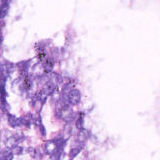

In [17]:
args["image_filepath"] = "/content/gdrive/Othercomputers/My Laptop/Google Drive/College/GasHisSDB/TCGA Image Snippets/TCGA-BR-8077-01Z-00-DX1.8c68b0bb-ef3f-41e4-bd01-8a1dbb5ee8c1.svs-11926-22400-11360.png"
args["image_filepath"] = "/content/160_unzip/160/Abnormal/Abnormal-10049.png"

%matplotlib inline
image = Image.open(args["image_filepath"])
print_predictions(args)
image

/content/gdrive/Othercomputers/My Laptop/Google Drive/College/GasHisSDB/TCGA Image Snippets
Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


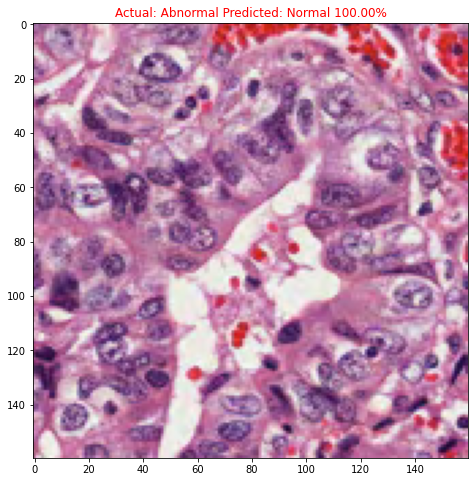

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


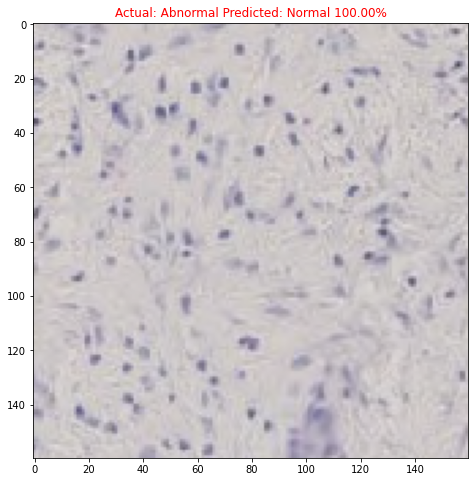

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


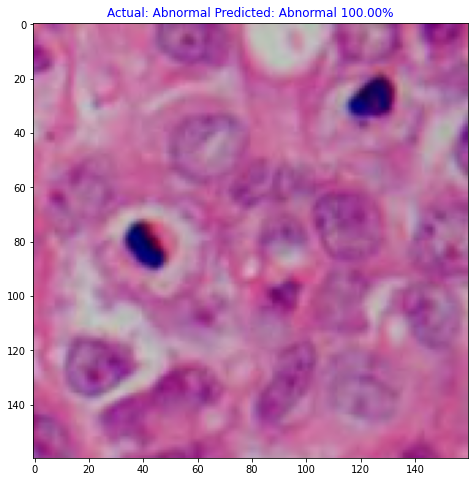

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


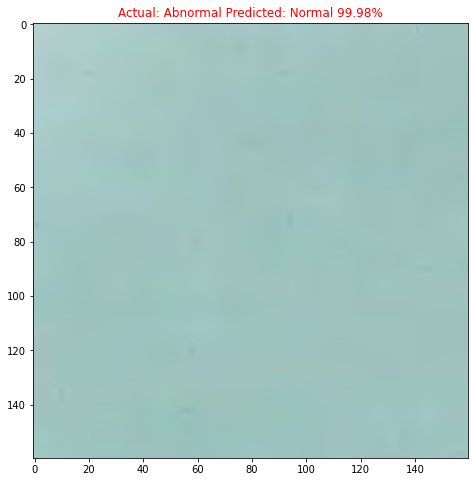

Prediction: Normal Probability: 84.0%
Diagnostic WSI Result: Abnormal


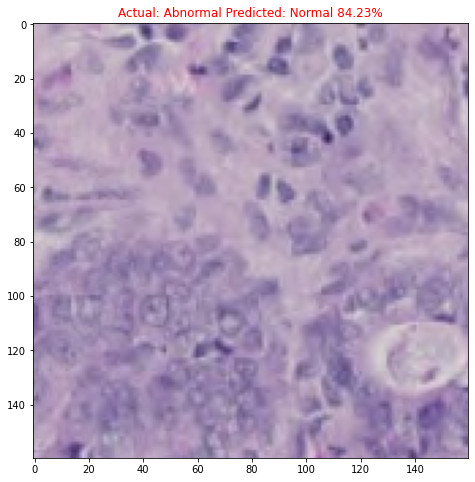

Prediction: Normal Probability: 98.0%
Diagnostic WSI Result: Abnormal


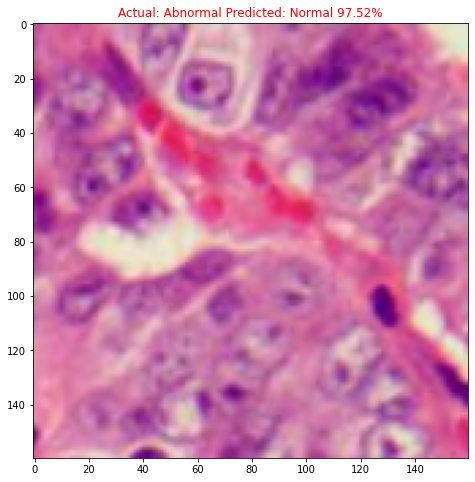

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


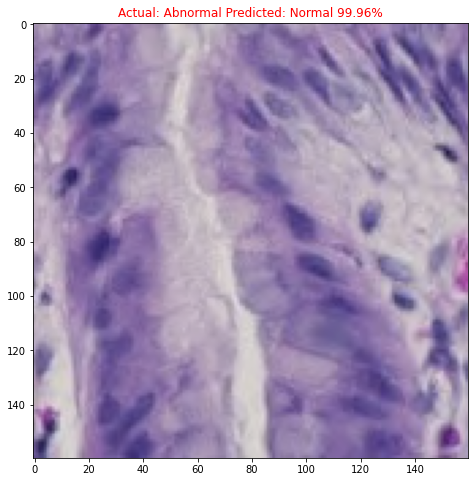

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


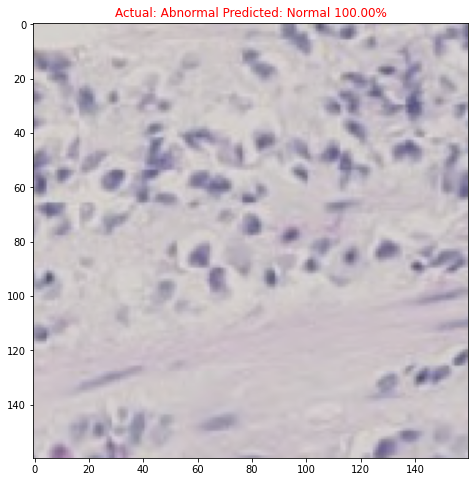

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


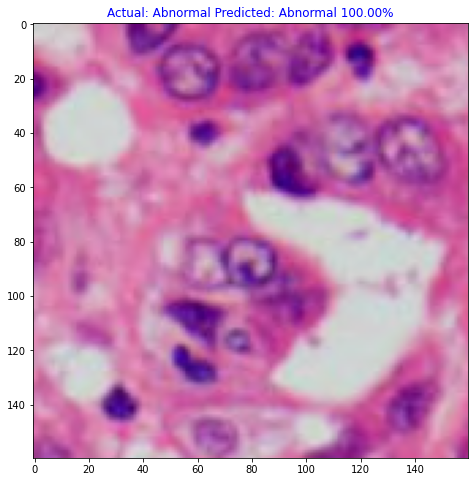

Prediction: Normal Probability: 99.0%
Diagnostic WSI Result: Abnormal


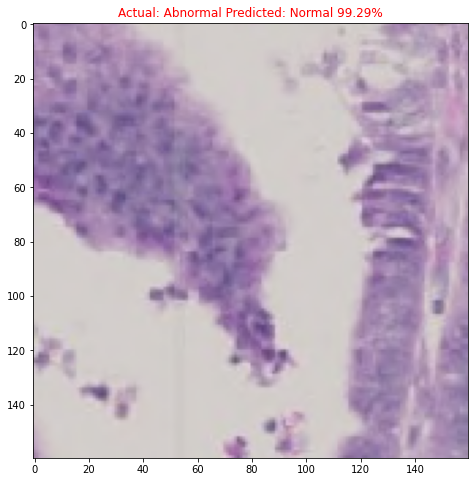

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


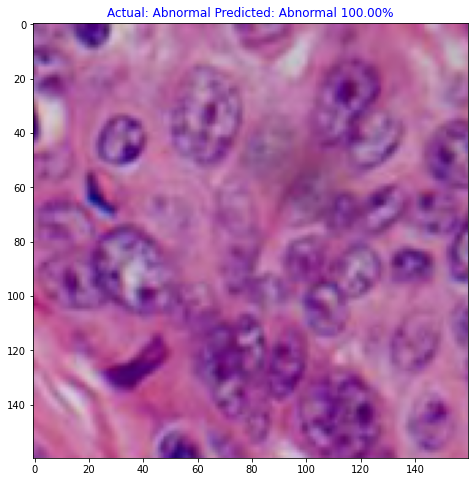

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


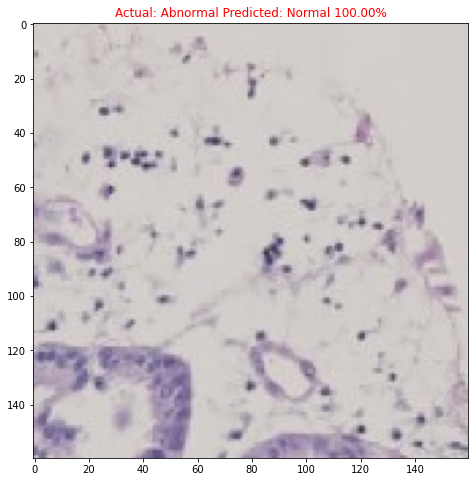

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


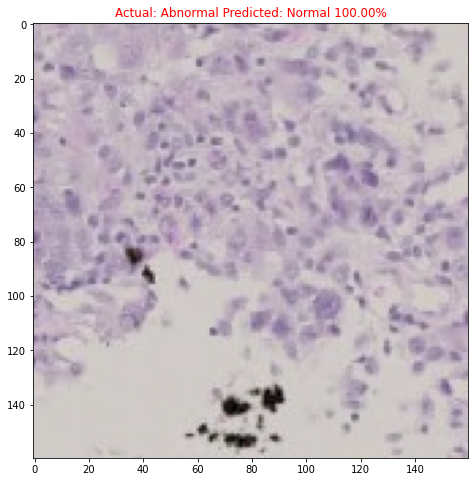

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


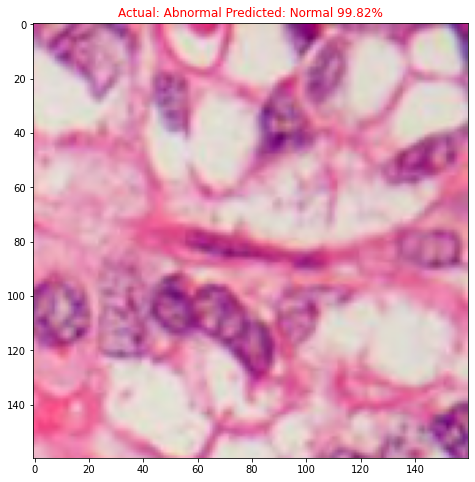

Prediction: Normal Probability: 96.0%
Diagnostic WSI Result: Abnormal


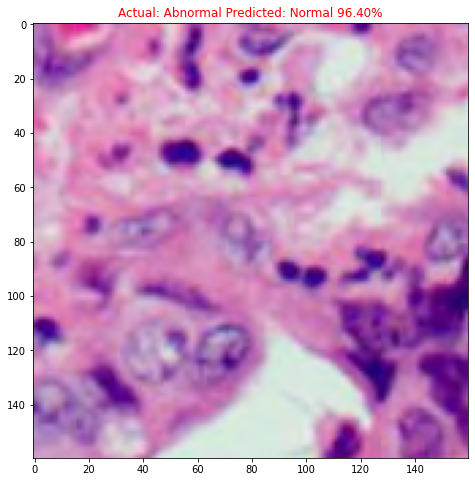

Prediction: Normal Probability: 96.0%
Diagnostic WSI Result: Abnormal


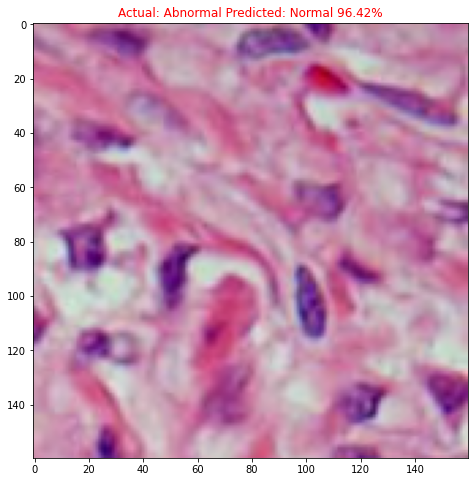

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


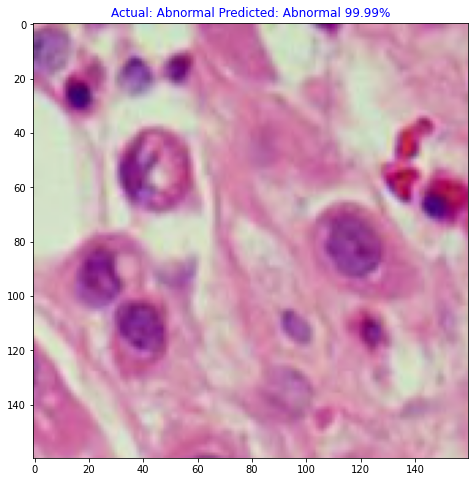

Prediction: Abnormal Probability: 89.0%
Diagnostic WSI Result: Abnormal


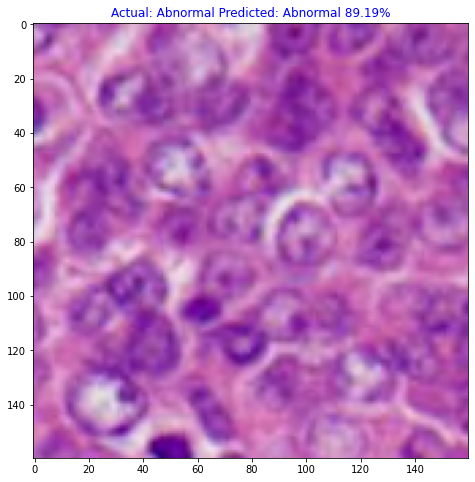

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


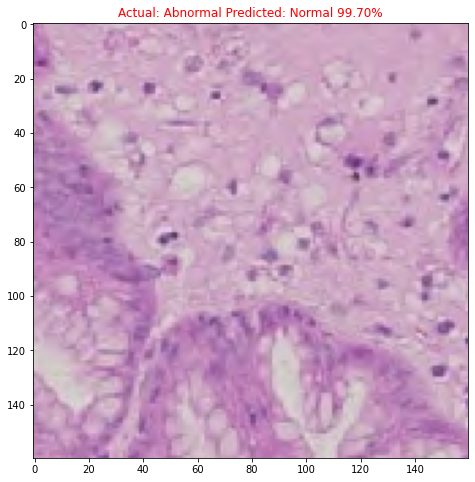

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


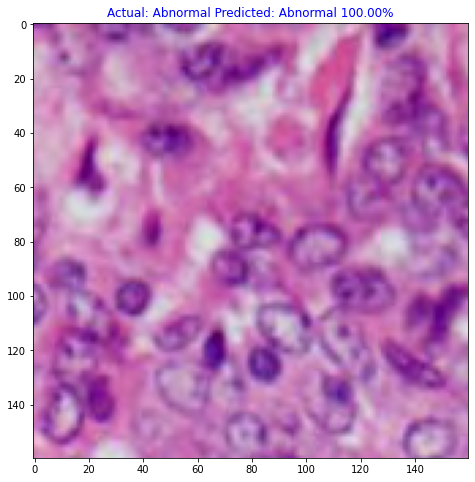

Prediction: Normal Probability: 98.0%
Diagnostic WSI Result: Abnormal


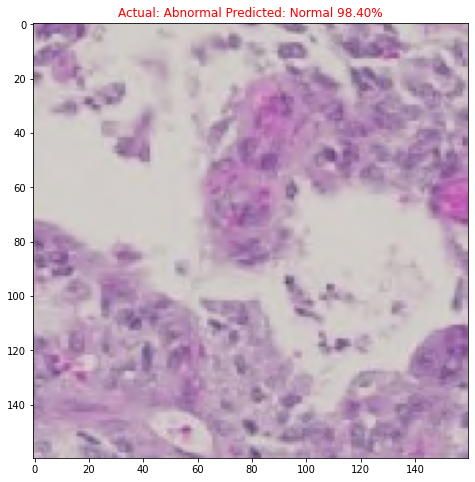

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


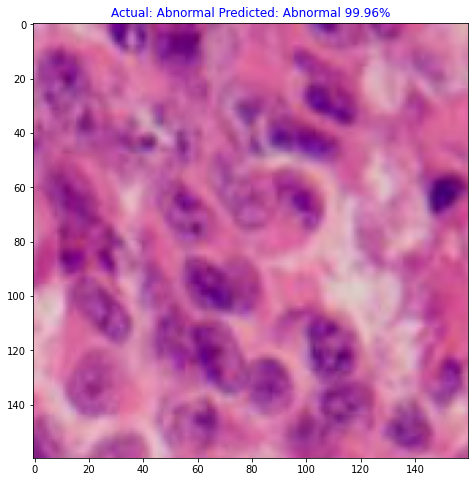

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


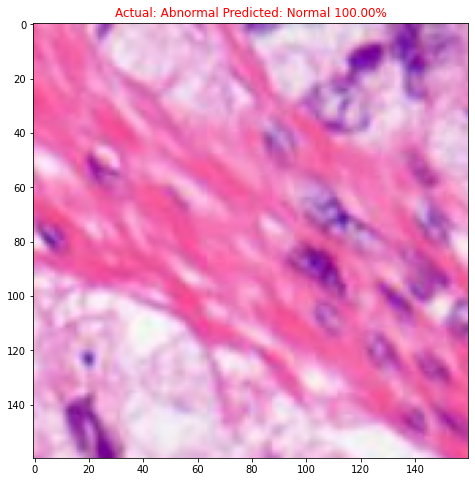

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


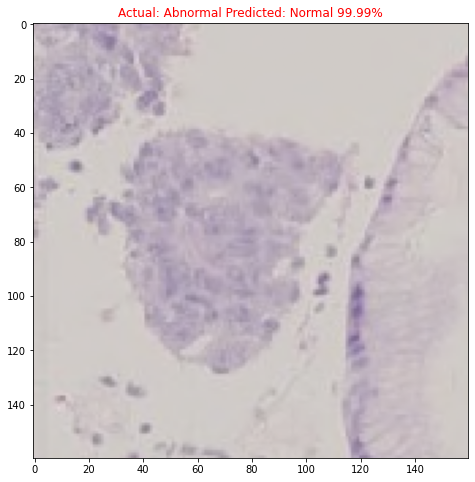

Prediction: Normal Probability: 61.0%
Diagnostic WSI Result: Abnormal


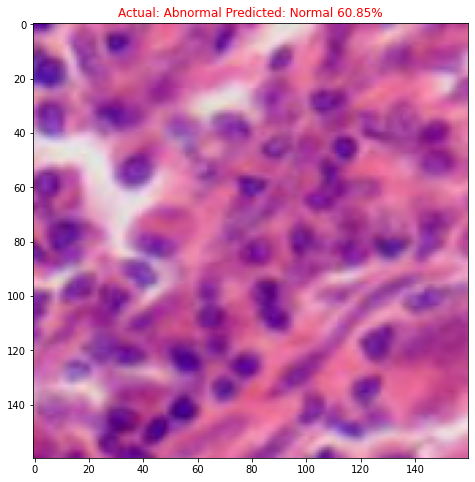

Prediction: Abnormal Probability: 99.0%
Diagnostic WSI Result: Abnormal


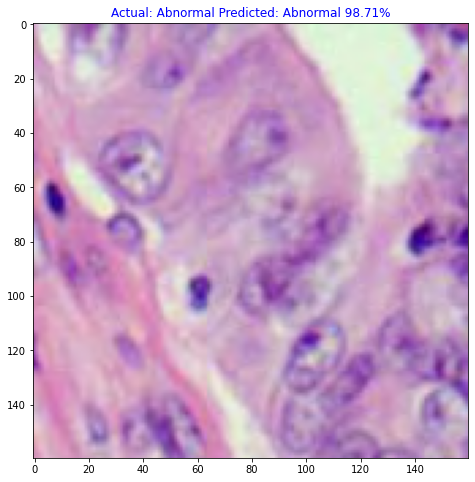

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


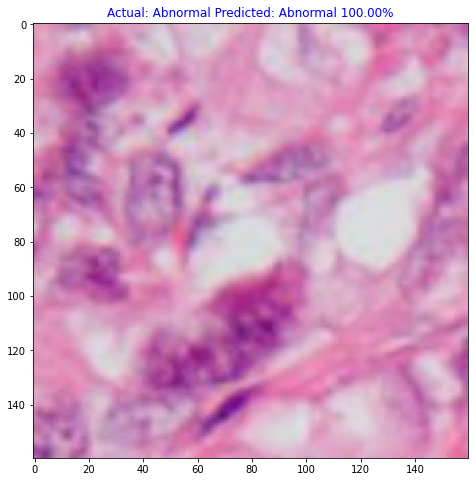

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


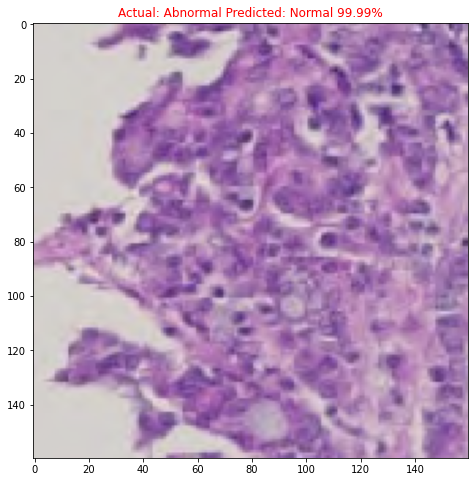

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


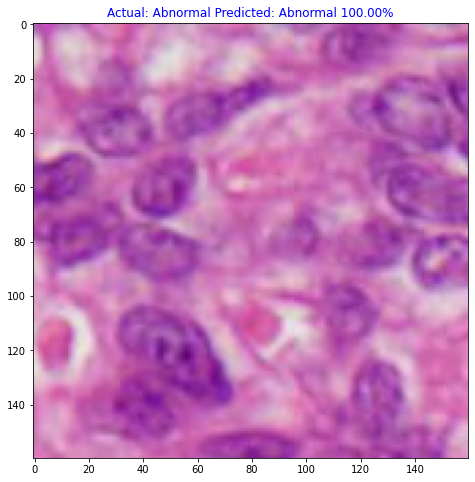

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


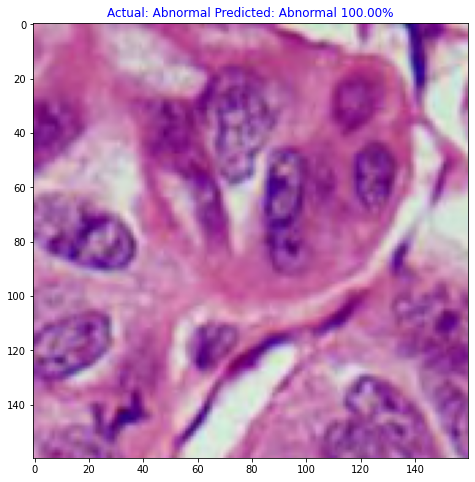

Prediction: Normal Probability: 100.0%
Diagnostic WSI Result: Abnormal


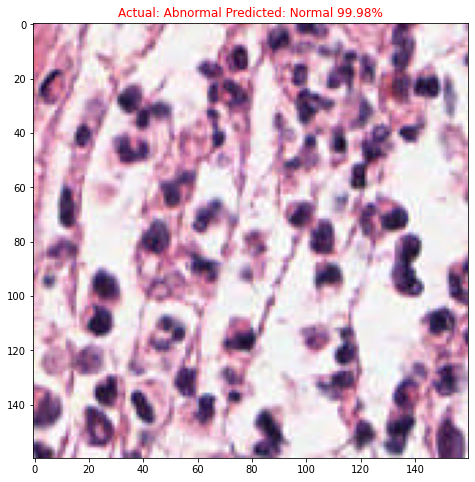

Prediction: Abnormal Probability: 96.0%
Diagnostic WSI Result: Abnormal


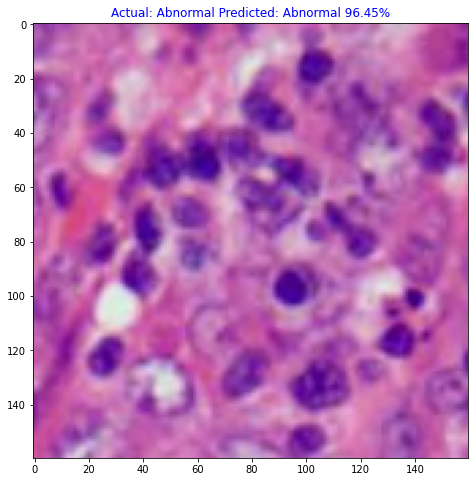

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


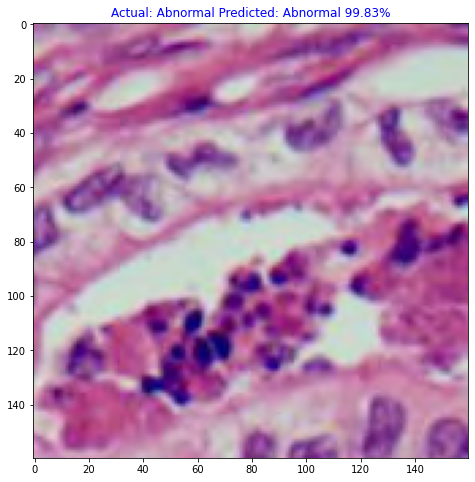

Prediction: Abnormal Probability: 100.0%
Diagnostic WSI Result: Abnormal


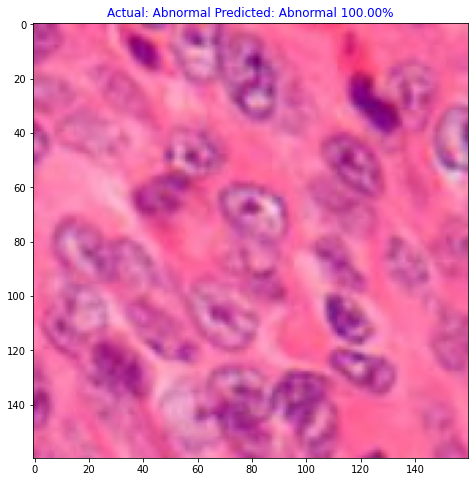

Prediction: Abnormal Probability: 96.0%
Diagnostic WSI Result: Abnormal


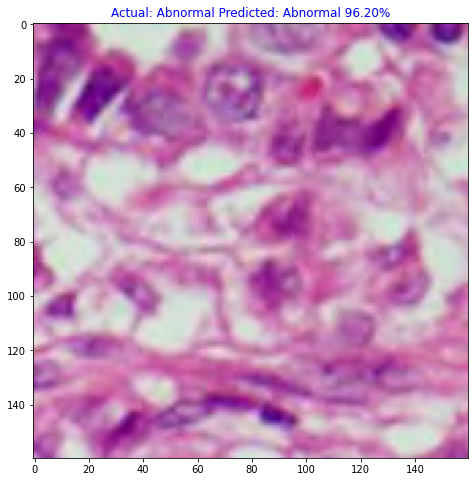

RuntimeError: ignored

In [18]:
import matplotlib.pyplot as plt
start_time = time.time()
for dirpath, dirnames, filenames in os.walk("/content/gdrive/Othercomputers/My Laptop/Google Drive/College/GasHisSDB/TCGA Image Snippets"):
    print(dirpath)
    predicted_abnormal_count = 0
    count = 0
    for file_name in filenames:

        file_code = file_name[13:15]
        file_result = 'Abnormal' if file_code == '01' else 'Normal'

        args["image_filepath"] = os.path.join(dirpath, file_name)

        %matplotlib inline
        image = Image.open(args["image_filepath"])
        class_label, y_prob, class_prob = print_predictions(args)

        if class_label == "Abnormal":
          predicted_abnormal_count += 1
        count += 1
        print("Diagnostic WSI Result: {}".format(file_result))
        # image.show()
        img = plt.imread(args["image_filepath"])
        plt.imshow(img)
        TCGA_accuracy = round(predicted_abnormal_count/count,4)*100
        title_color = 'red' if class_label == 'Normal' else 'blue'
        plt.title("Actual: Abnormal Predicted: {} {:.2f}%".format(class_label, round(class_prob,4)*100), fontdict={'color' : title_color})
        figure_name = file_name.replace(".png", "_predicted.png")
        result_file_path = os.path.join(dirpath, figure_name)
        figure = plt.gcf()
        figure.set_size_inches(8, 8)
        plt.savefig(result_file_path,bbox_inches='tight')

        plt.show()
        # break

        # sleep(1)
print("Processing Time: {}".format(time.time()-start_time))

print("{}/{} are abnormal or {}%".format(predicted_abnormal_count, count, TCGA_accuracy))


In [ ]:
def create_collage(width, height, listofimages):
    cols = 5
    rows = 5
    thumbnail_width = width//cols
    thumbnail_height = height//rows
    size = thumbnail_width, thumbnail_height
    new_im = Image.new('RGB', (width, height))
    ims = []
    for p in listofimages:
        im = Image.open(p)
        im.thumbnail(size)
        ims.append(im)
    i = 0
    x = 0
    y = 0
    for col in range(cols):
        for row in range(rows):
            print(i, x, y)
            new_im.paste(ims[i], (x, y))
            i += 1
            y += thumbnail_height
        x += thumbnail_width
        y = 0

    new_im.save("Collage_Pred.jpg")



In [ ]:
# C:\Users\pamci\Google Drive\College\GasHisSDB\TCGA Image Prediction Graphs
image_name_list = []
for dirpath, dirnames, filenames in os.walk("/content/gdrive/Othercomputers/My Laptop/Google Drive/College/GasHisSDB/TCGA Image Prediction Graphs"):
    print(dirpath)
    predicted_abnormal_count = 0
    count = 0
    for file_name in filenames:
      image_name_list.append(os.path.join(dirpath, file_name))
      # print(file_name)

print(len(image_name_list[:25]))
create_collage(475*5, 482*5, image_name_list[:25])